In [1]:
import os
import random
import sys

import cv2
import numpy as np
import torch
from matplotlib import pyplot as plt
from scipy.spatial import distance
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE

sys.path.append("..")

# Plotting imports


# Slowfast imports
from slowfast.datasets.loader import construct_loader
from slowfast.models import build_model
from slowfast.utils.checkpoint import load_checkpoint
from slowfast.utils.parser import alt_parse_args, load_config

/home/kukushkin/miniconda3/envs/env/lib/python3.10/site-packages/torchvision/transforms/_functional_video.py:6: UserWarning: The 'torchvision.transforms._functional_video' module is deprecated since 0.12 and will be removed in the future. Please use the 'torchvision.transforms.functional' module instead.
  warnings.warn(
/home/kukushkin/miniconda3/envs/env/lib/python3.10/site-packages/torchvision/transforms/_transforms_video.py:22: UserWarning: The 'torchvision.transforms._transforms_video' module is deprecated since 0.12 and will be removed in the future. Please use the 'torchvision.transforms' module instead.
  warnings.warn(


In [2]:
def get_video_frames(video_name):
    # Get original video
    video_path = "/home/kukushkin/imslowfast/dataset/videos"

    batch_frames = []

    for path in video_name:
        cap = cv2.VideoCapture(os.path.join(video_path, path))

        frames = []
        while cap.isOpened():
            ret, frame = cap.read()

            if not ret:
                break
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frame = cv2.resize(frame, (256, 256))

            frames.append(frame)

        batch_frames.append(np.stack(frames))

    return np.stack(batch_frames)

In [3]:
def temporal_sampling(frames, start_idx, end_idx, num_samples):
    """
    Given the start and end frame index, sample num_samples frames between
    the start and end with equal interval.
    Args:
        frames (tensor): a tensor of video frames, dimension is
            `num video frames` x `channel` x `height` x `width`.
        start_idx (int): the index of the start frame.
        end_idx (int): the index of the end frame.
        num_samples (int): number of frames to sample.
    Returns:
        frames (tersor): a tensor of temporal sampled video frames, dimension is
            `num clip frames` x `channel` x `height` x `width`.
    """
    index = torch.linspace(start_idx, end_idx, num_samples)
    index = torch.clamp(index, 0, frames.shape[0] - 1).long()
    frames = torch.index_select(frames, 0, index)
    # convert to numpy
    frames = frames.numpy()
    return frames

(16, 256, 256, 3)


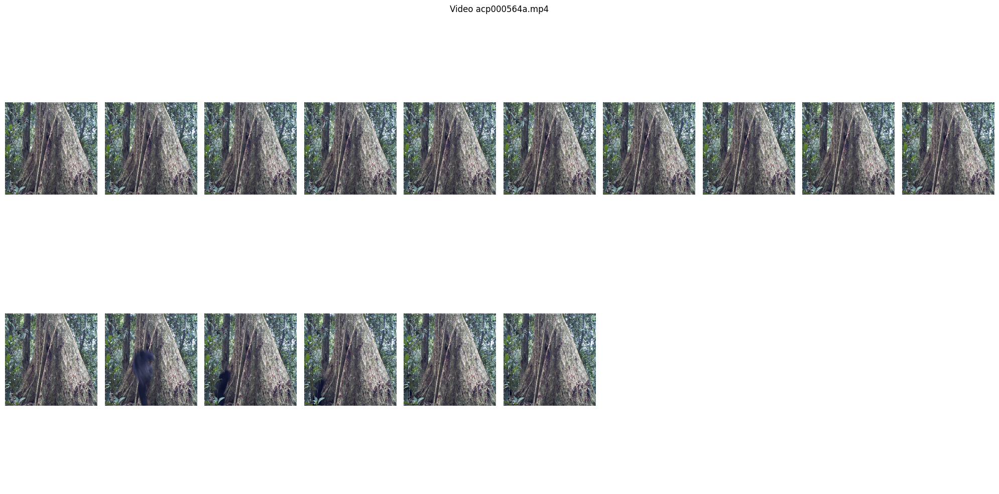

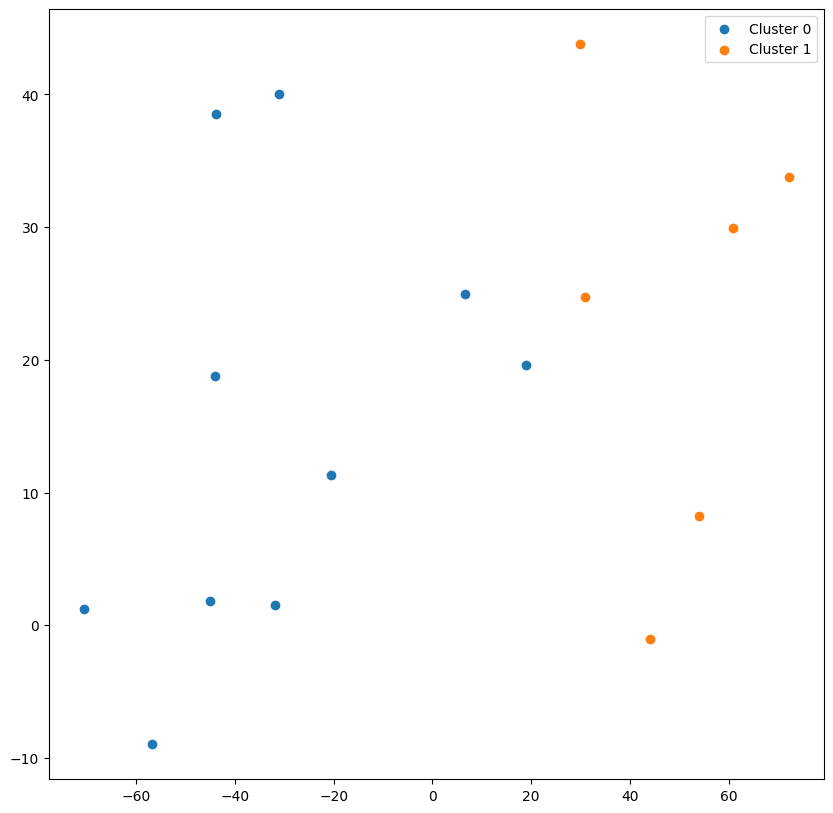

In [4]:
vid_name = "acp000564a.mp4"
frames = get_video_frames([vid_name])[0]
# convert frames to tensor
frames = torch.tensor(frames)
frames = temporal_sampling(frames, 0, frames.shape[0], 16)
print(frames.shape)

fps = 24


# apply clustering to the frames
def apply_clustering(frames, n_clusters=10):
    # Reshape the frames
    frames = frames.reshape(-1, 256, 256, 3)
    frames = frames.reshape(-1, 256 * 256 * 3)

    # Apply KMeans clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(frames)
    labels = kmeans.labels_

    return labels


labels = apply_clustering(frames, n_clusters=2)


# Visualize the clusters
def visualize_clusters(frames, labels, n_clusters=10, max_columns=16):
    # Reshape frames if necessary
    frames = frames.reshape(-1, 256, 256, 3)

    # Determine the maximum number of frames in any cluster
    max_frames = max(len(frames[labels == i]) for i in range(n_clusters))
    num_columns = min(max_frames, max_columns)  # Limit columns to max_columns

    # Create figure with dynamic rows and columns
    fig, axs = plt.subplots(n_clusters, num_columns, figsize=(20, 10), squeeze=False)
    # add title
    fig.suptitle(f"Video {vid_name}")

    for i in range(n_clusters):
        cluster_frames = frames[labels == i]
        num_frames = len(cluster_frames)

        # Plot each frame in its respective cluster
        for j in range(num_columns):
            if j < num_frames:
                axs[i, j].imshow(cluster_frames[j])
            axs[i, j].axis("off")  # Turn off axis for all subplots

    plt.tight_layout()
    plt.show()


visualize_clusters(frames, labels, n_clusters=2)

# visualise using TSNE


def visualize_tsne(frames, labels, n_clusters=10):
    # Reshape the frames
    frames = frames.reshape(-1, 256, 256, 3)
    frames = frames.reshape(-1, 256 * 256 * 3)

    # Apply TSNE
    tsne = TSNE(n_components=2, random_state=0, perplexity=5).fit_transform(frames)

    # Create a figure
    fig, ax = plt.subplots(figsize=(10, 10))

    for i in range(n_clusters):
        cluster_tsne = tsne[labels == i]

        ax.scatter(cluster_tsne[:, 0], cluster_tsne[:, 1], label=f"Cluster {i}")

    ax.legend()
    plt.show()


visualize_tsne(frames, labels, n_clusters=2)

In [5]:
behaviours_file = "../dataset/metadata/behaviours.txt"

with open(behaviours_file, "rb") as f:
    behaviours = [beh.decode("utf-8").strip() for beh in f.readlines()]

In [6]:
def get_video_frames(video_name):
    # Get original video
    video_path = "../dataset/videos/"

    batch_frames = []

    for path in video_name:
        cap = cv2.VideoCapture(os.path.join(video_path, path))
        frames = []
        while cap.isOpened():
            ret, frame = cap.read()
            if not ret:
                break
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frame = cv2.resize(frame, (256, 256))
            frames.append(frame)

        batch_frames.append(np.stack(frames))

    return np.stack(batch_frames)


def alt_load_config(cfg_path):
    args = alt_parse_args()[:-1]
    cfg = load_config(
        args[0],
        path_to_config=cfg_path,
    )
    return cfg


def load_model(cfg_path, ckpt_path, map_location="cpu", ckpt_type="pytorch"):
    # Load model config
    cfg = alt_load_config(cfg_path)
    model = build_model(cfg)
    print(ckpt_path)
    if ckpt_type == "pytorch":
    
        checkpoint = torch.load(ckpt_path, map_location=map_location)
        model.load_state_dict(checkpoint["model_state"])
    elif ckpt_type == "caffe2":
        load_checkpoint(
            path_to_checkpoint=ckpt_path,
            model=model,
            convert_from_caffe2=True,
            data_parallel=False,
        )
    else:
        raise ValueError("Invalid checkpoint type. Choose 'pytorch' or 'caffe2'")
    return model

In [7]:
cfg_path = "/home/kukushkin/imslowfast/configs/SLOW_8x8_R50_Local (1).yaml"
bl_model_path = "/home/kukushkin/imslowfast/projects/slow/SLOWONLY_8x8_R50.pkl"
nkinetics_cfg_path = "/home/kukushkin/imslowfast/configs/SLOW_8x8_R50_FGBG_Local.yaml"
cfg = alt_load_config(nkinetics_cfg_path)
loader = construct_loader(alt_load_config(nkinetics_cfg_path), "train")

model = load_model(cfg_path, bl_model_path, ckpt_type="caffe2")
classifier = model.head.projection

SAMPLING.BALANCED: False; BALANCE_TYPE: None


/home/kukushkin/imslowfast/projects/slow/SLOWONLY_8x8_R50.pkl


!! pred_b: (400,) does not match head.projection.bias: (14,)
!! pred_w: (400, 2048) does not match head.projection.weight: (14, 2048)
Not loaded {'head.projection.bias', 'head.projection.weight'}


In [8]:
activations = dict()
activations["s1.pathway0_stem.relu"] = dict()
activations["s2.pathway0_res0.relu"] = dict()
activations["s3.pathway0_res0.relu"] = dict()
activations["s4.pathway0_res0.relu"] = dict()
activations["s5.pathway0_res0.relu"] = dict()


def get_activation(name):
    def hook(model, input, output):
        activations[name][output.get_device()] = output.detach().cpu()

    return hook

In [9]:
model.s5.pathway0_res0.branch2.b_relu

ReLU(inplace=True)

In [10]:
model.s1.pathway0_stem.relu.register_forward_hook(
    get_activation("s1.pathway0_stem.relu")
)
model.s2.pathway0_res0.relu.register_forward_hook(
    get_activation("s2.pathway0_res0.relu")
)
model.s3.pathway0_res0.relu.register_forward_hook(
    get_activation("s3.pathway0_res0.relu")
)
model.s4.pathway0_res0.relu.register_forward_hook(
    get_activation("s4.pathway0_res0.relu")
)
model.s5.pathway0_res0.relu.register_forward_hook(
    get_activation("s5.pathway0_res0.relu")
)

/home/kukushkin/imslowfast/notebooks/../slowfast/datasets/decoder.py:335: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /opt/conda/conda-bld/pytorch_1716905979055/work/torch/csrc/utils/tensor_numpy.cpp:206.)
  video_tensor = torch.from_numpy(np.frombuffer(video_handle, dtype=np.uint8))
/home/kukushkin/imslowfast/notebooks/../slowfast/datasets/decoder.py:335: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppres

feature_maps torch.Size([1, 2048, 16, 8, 8])
activation set (16, 131072)
activations_sign_set (16, 131072)
[224.90647888183594, 224.90647888183594, 465.92323303222656, 716.6773529052734, 925.5231475830078, 1130.567642211914, 1352.8764953613281, 1566.6715545654297, 1769.0352172851562, 1972.2079467773438, 2194.2913208007812, 2420.2283782958984, 2647.4137573242188, 2883.3524475097656, 3116.782669067383, 3411.275100708008]
final selection: [7, 9]
cluster: [8, 8]
selection_dict:  {np.int32(0): [0, 1, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15], np.int32(1): [2], np.int32(2): [3, 10]}


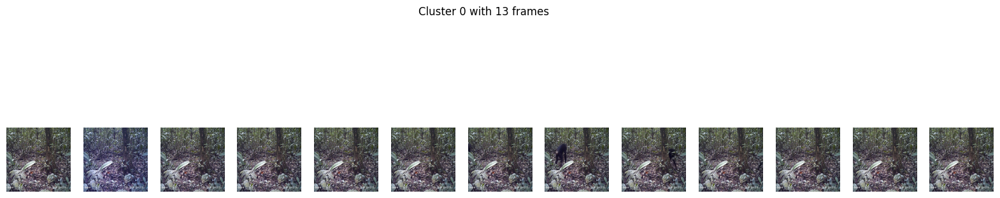

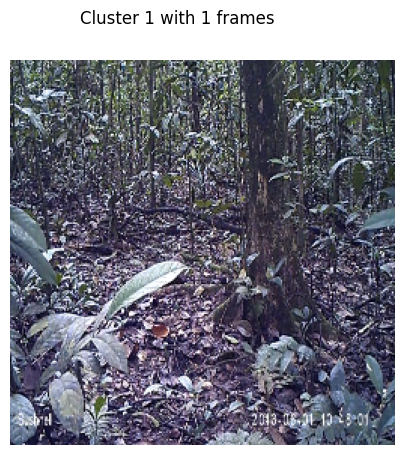

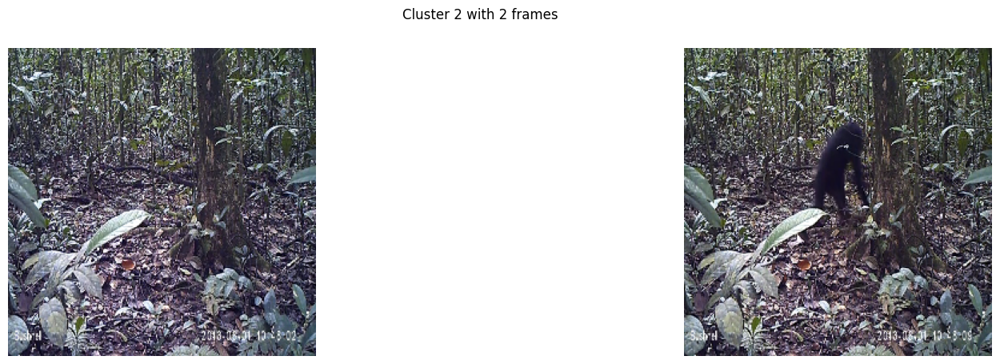

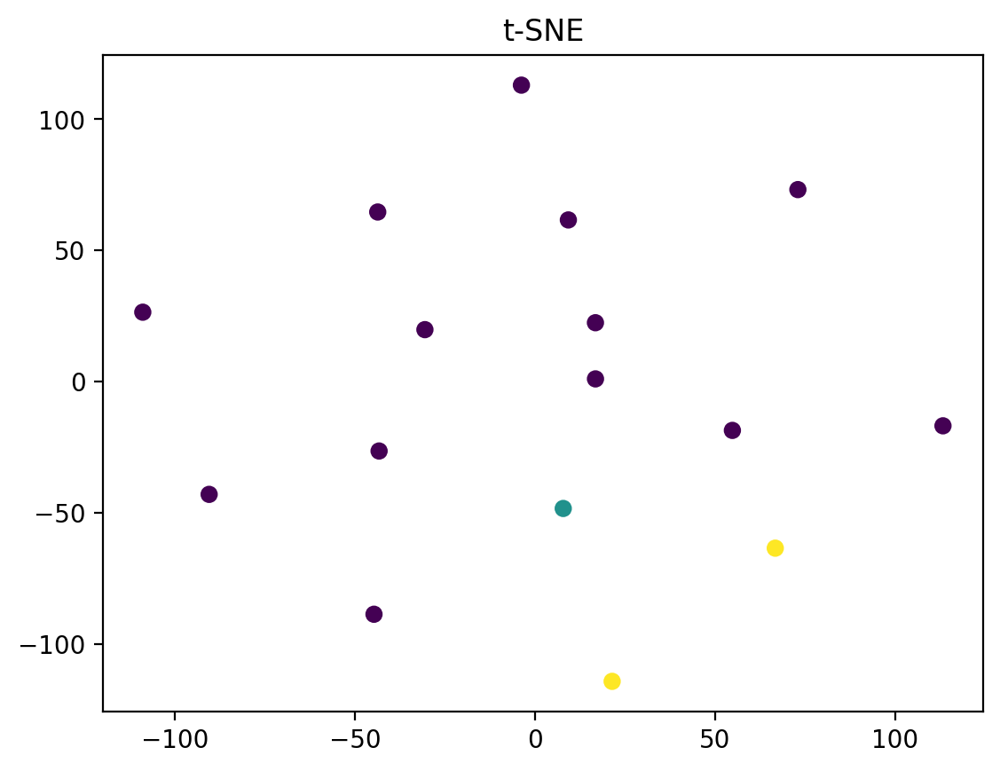

feature_maps torch.Size([1, 2048, 16, 8, 8])
activation set (16, 131072)
activations_sign_set (16, 131072)
[228.6827392578125, 228.6827392578125, 465.882080078125, 720.6398010253906, 945.895751953125, 1152.9735412597656, 1382.0989074707031, 1610.0162048339844, 1826.6133880615234, 2047.4023742675781, 2277.571823120117, 2518.9681854248047, 2756.5906677246094, 3003.2394409179688, 3251.445526123047, 3551.0750427246094]
final selection: [1, 8]
cluster: [8, 8]
selection_dict:  {np.int32(1): [0, 3, 4, 5, 6, 7, 9, 10, 12, 14], np.int32(0): [1, 2, 8, 11, 13], np.int32(2): [15]}


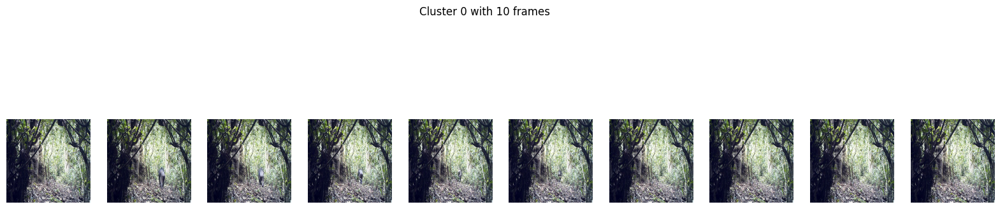

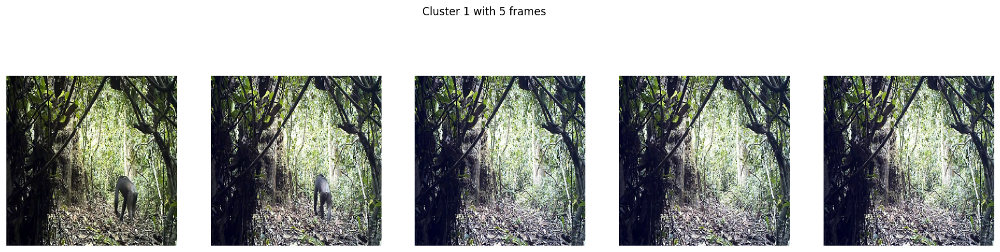

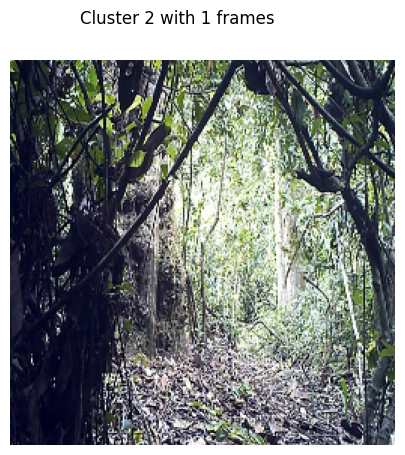

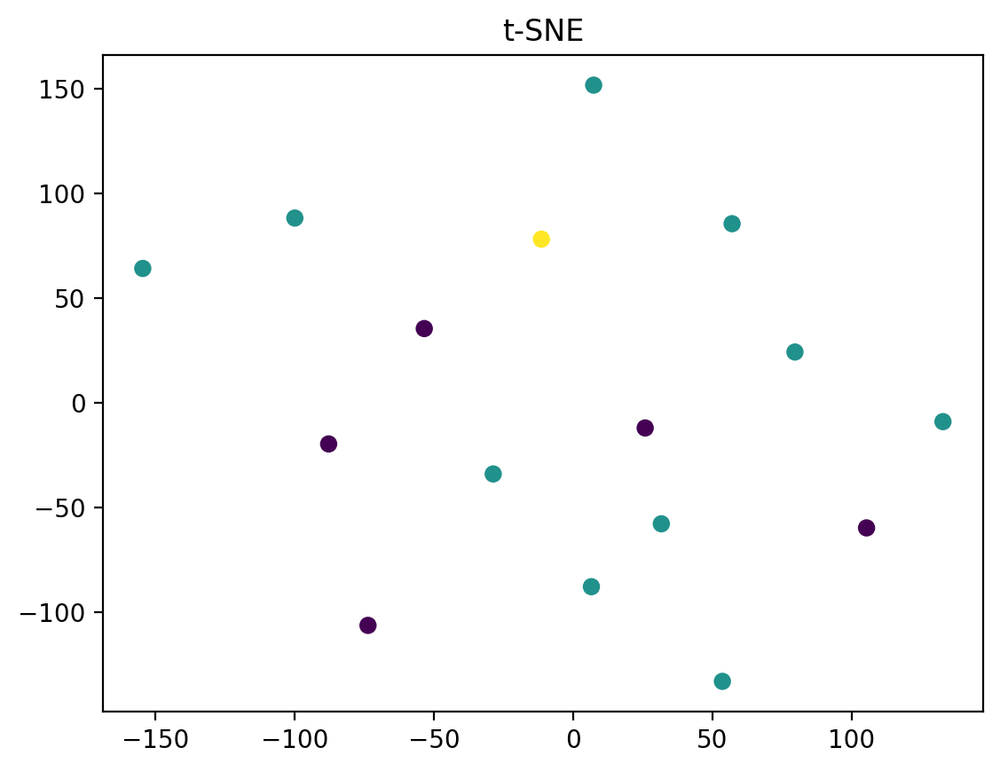

feature_maps torch.Size([1, 2048, 16, 8, 8])
activation set (16, 131072)
activations_sign_set (16, 131072)
[223.5482177734375, 223.5482177734375, 454.1847381591797, 694.6688385009766, 905.1976013183594, 1112.3422088623047, 1331.9259338378906, 1541.5878601074219, 1753.803695678711, 1972.103775024414, 2193.695358276367, 2419.897186279297, 2637.298599243164, 2871.757858276367, 3106.4547424316406, 3399.5389709472656]
final selection: [0, 9]
cluster: [8, 8]
selection_dict:  {np.int32(2): [0, 1, 2, 4, 5, 6, 7, 8, 10, 11, 12, 13, 14, 15], np.int32(0): [3], np.int32(1): [9]}


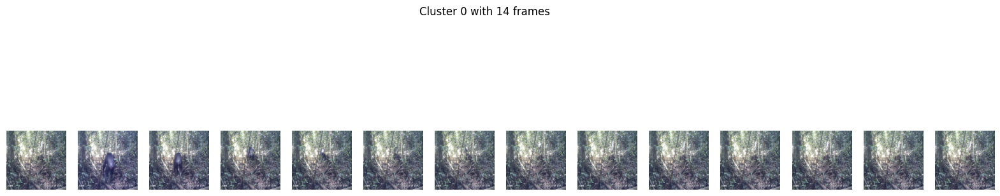

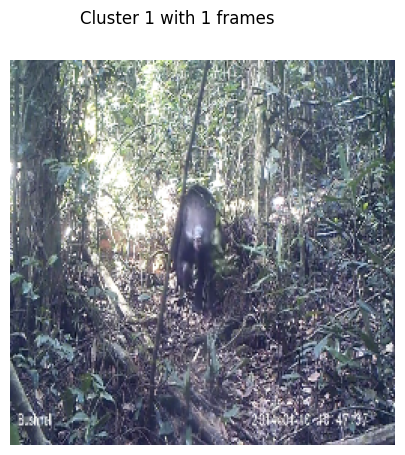

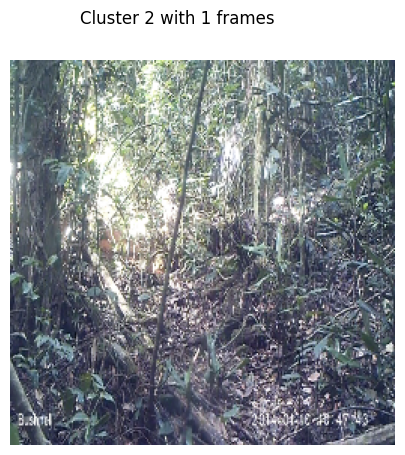

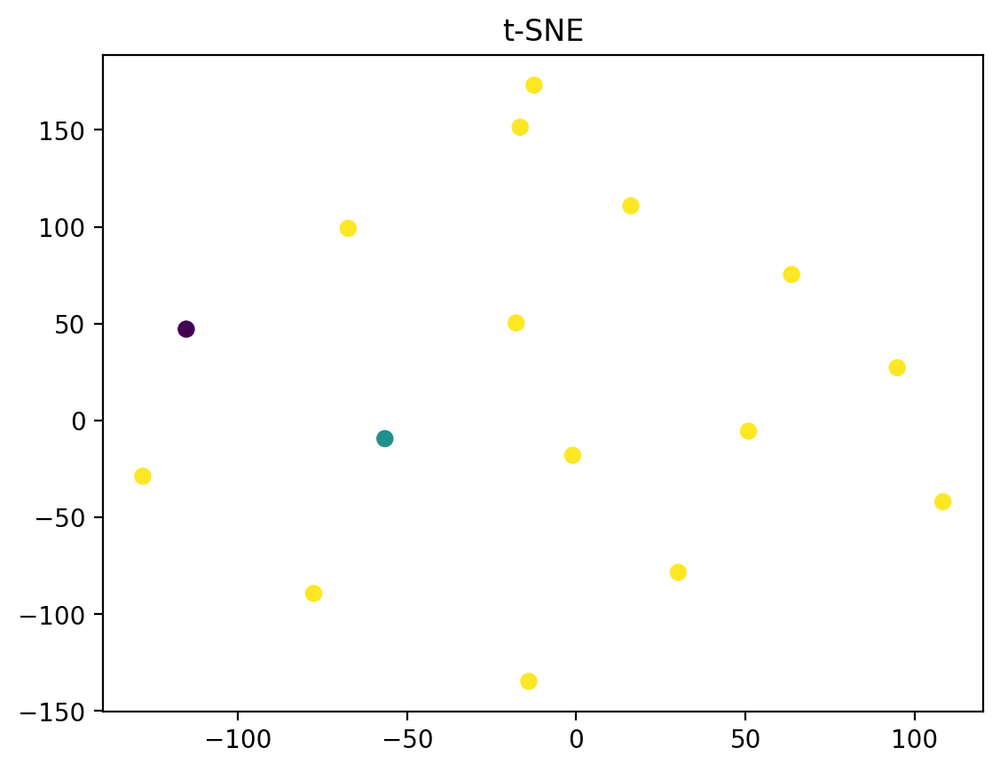

feature_maps torch.Size([1, 2048, 16, 8, 8])
activation set (16, 131072)
activations_sign_set (16, 131072)
[219.34597778320312, 219.34597778320312, 457.3993225097656, 698.3499145507812, 906.1024627685547, 1127.0813751220703, 1357.9555206298828, 1563.7101287841797, 1769.9524230957031, 1975.9066925048828, 2193.8440551757812, 2419.456512451172, 2637.4811401367188, 2861.446273803711, 3088.4627075195312, 3378.6312561035156]
final selection: [1, 10]
cluster: [8, 8]
selection_dict:  {np.int32(0): [0, 1, 3, 4, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15], np.int32(2): [2], np.int32(1): [5]}


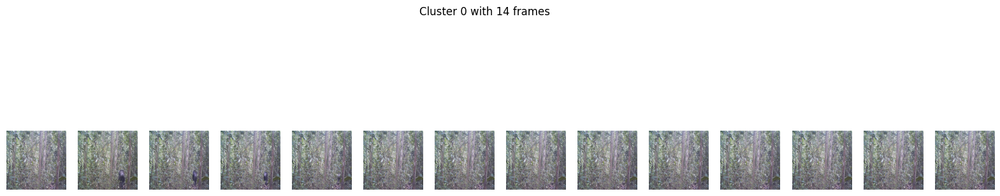

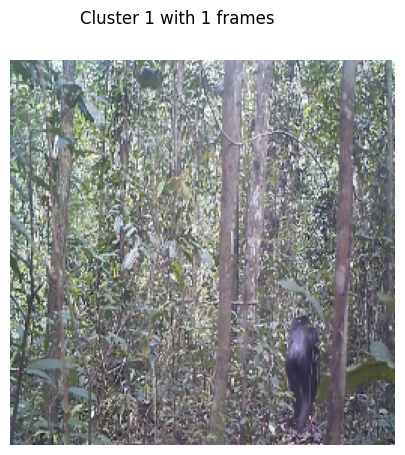

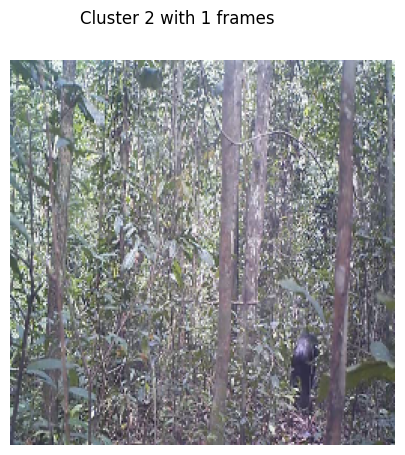

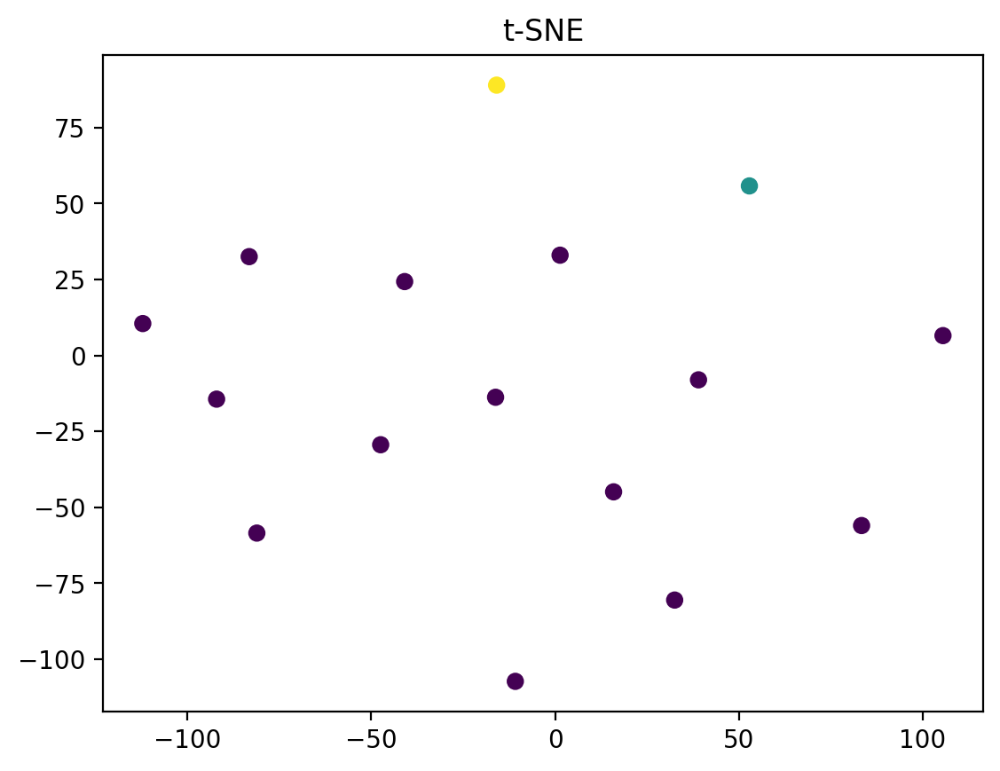

feature_maps torch.Size([1, 2048, 16, 8, 8])
activation set (16, 131072)
activations_sign_set (16, 131072)
[200.2766876220703, 200.2766876220703, 414.08143615722656, 638.0300140380859, 842.9930877685547, 1033.6627655029297, 1229.8685607910156, 1434.7357330322266, 1630.7196807861328, 1818.7738342285156, 2033.520004272461, 2247.082077026367, 2437.7559509277344, 2646.9319915771484, 2864.2672119140625, 3129.0728759765625]
final selection: [2, 9]
cluster: [8, 8]
selection_dict:  {np.int32(1): [0, 6, 9, 10, 12, 15], np.int32(2): [1, 2, 4, 5, 7, 8, 11, 13, 14], np.int32(0): [3]}


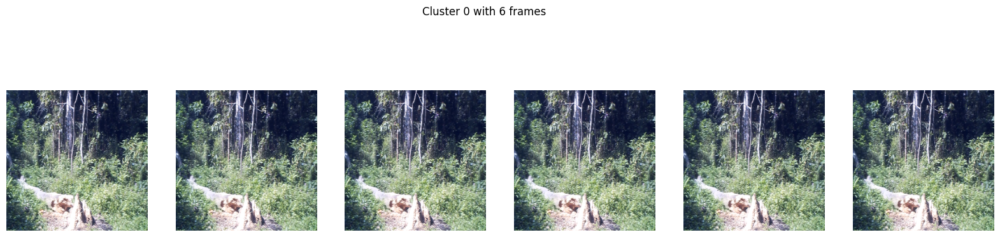

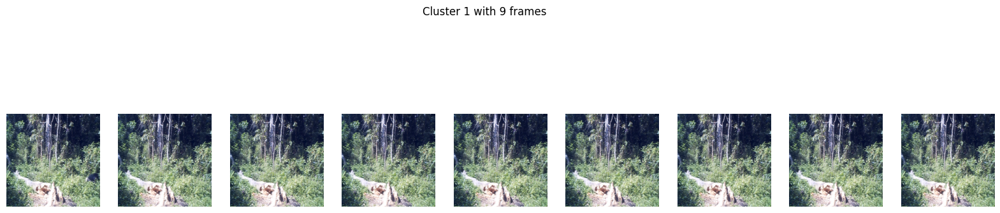

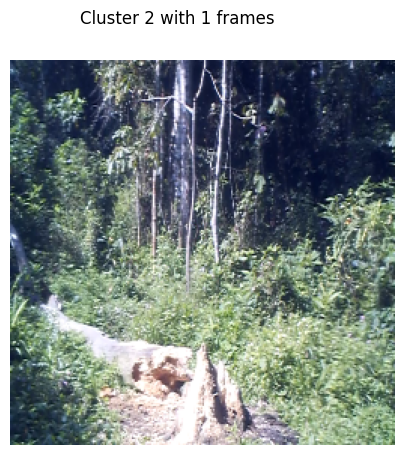

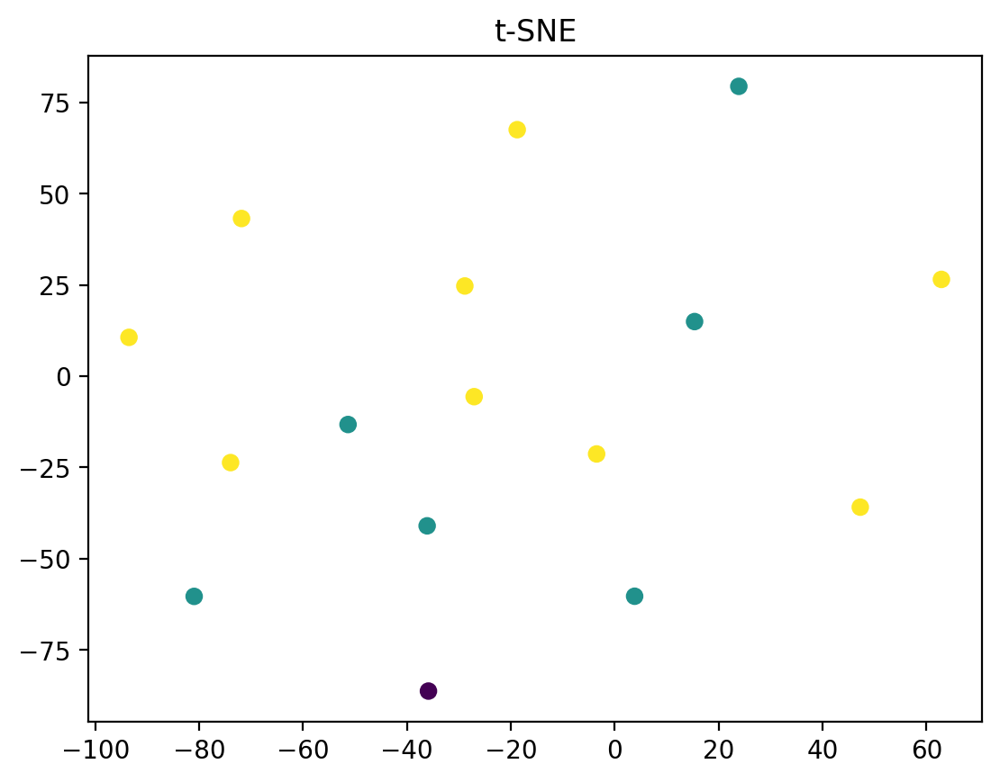

feature_maps torch.Size([1, 2048, 16, 8, 8])
activation set (16, 131072)
activations_sign_set (16, 131072)
[223.09732055664062, 223.09732055664062, 462.9405517578125, 719.472900390625, 945.6100463867188, 1181.5835876464844, 1434.6794891357422, 1667.543472290039, 1889.5603790283203, 2108.0406494140625, 2341.0909729003906, 2586.6278076171875, 2820.1727600097656, 3049.5245513916016, 3293.5904541015625, 3604.9463806152344]
final selection: [2, 9]
cluster: [8, 8]
selection_dict:  {np.int32(0): [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14], np.int32(2): [2], np.int32(1): [15]}


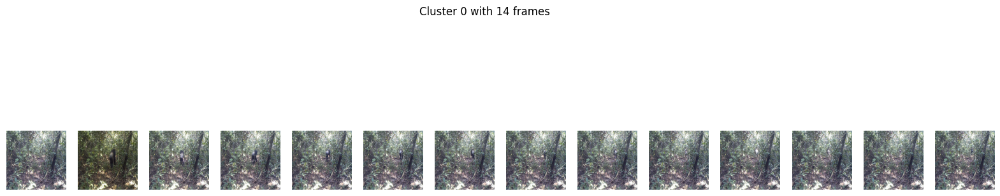

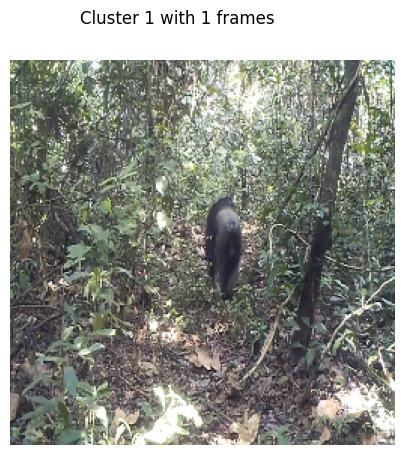

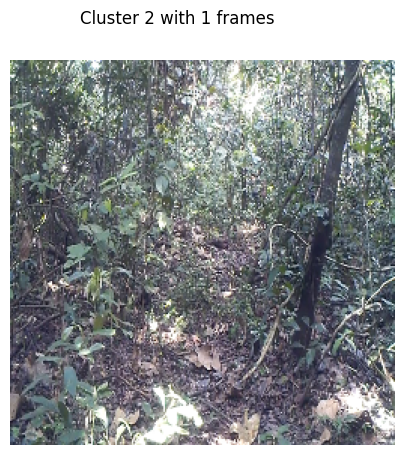

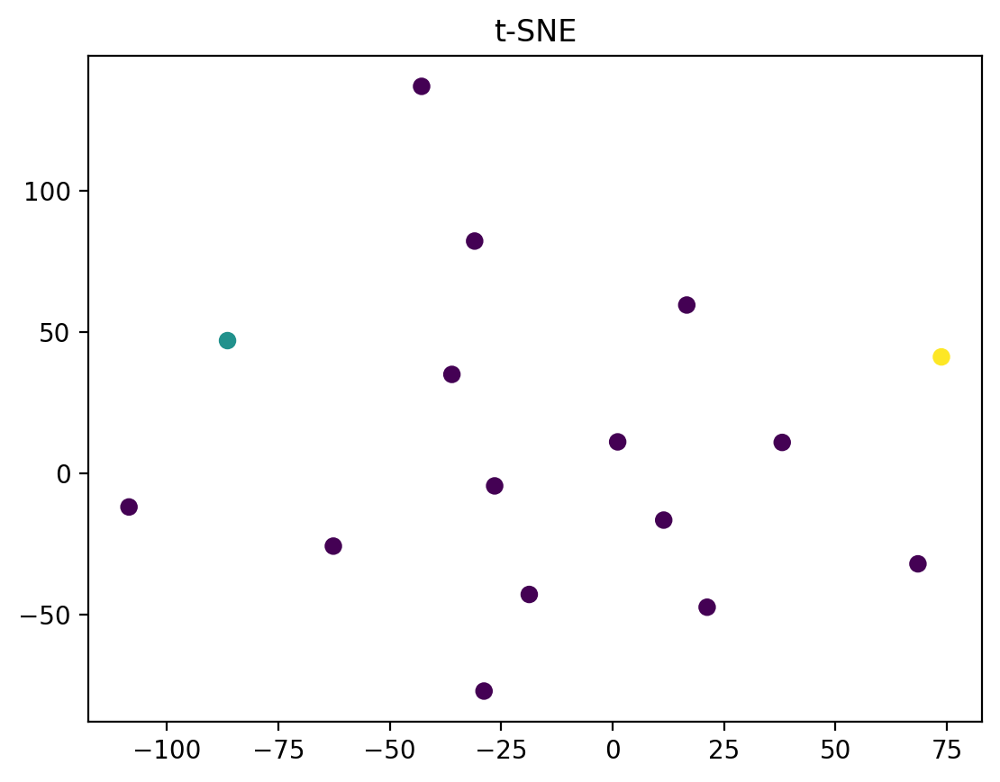

feature_maps torch.Size([1, 2048, 16, 8, 8])
activation set (16, 131072)
activations_sign_set (16, 131072)
[226.65235900878906, 226.65235900878906, 473.4977569580078, 740.2315826416016, 987.1389465332031, 1215.3858642578125, 1451.0198974609375, 1688.3102569580078, 1910.861083984375, 2136.5856170654297, 2375.3687896728516, 2622.303207397461, 2860.3759765625, 3111.425033569336, 3367.672836303711, 3665.1454010009766]
final selection: [7, 11]
cluster: [8, 8]
selection_dict:  {np.int32(2): [0, 1, 2, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 15], np.int32(1): [7], np.int32(0): [14]}


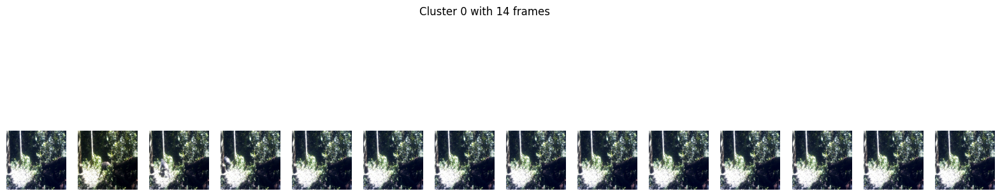

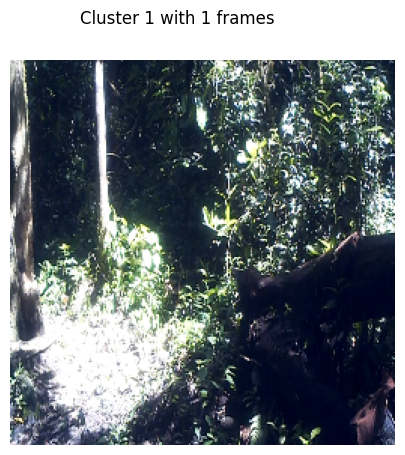

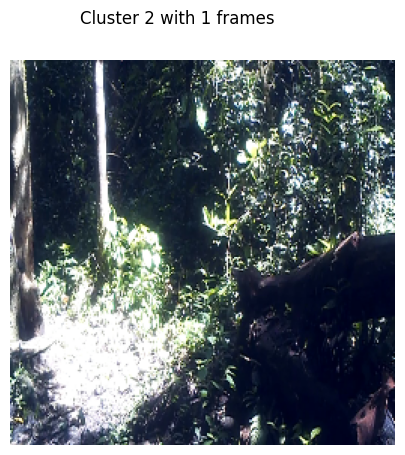

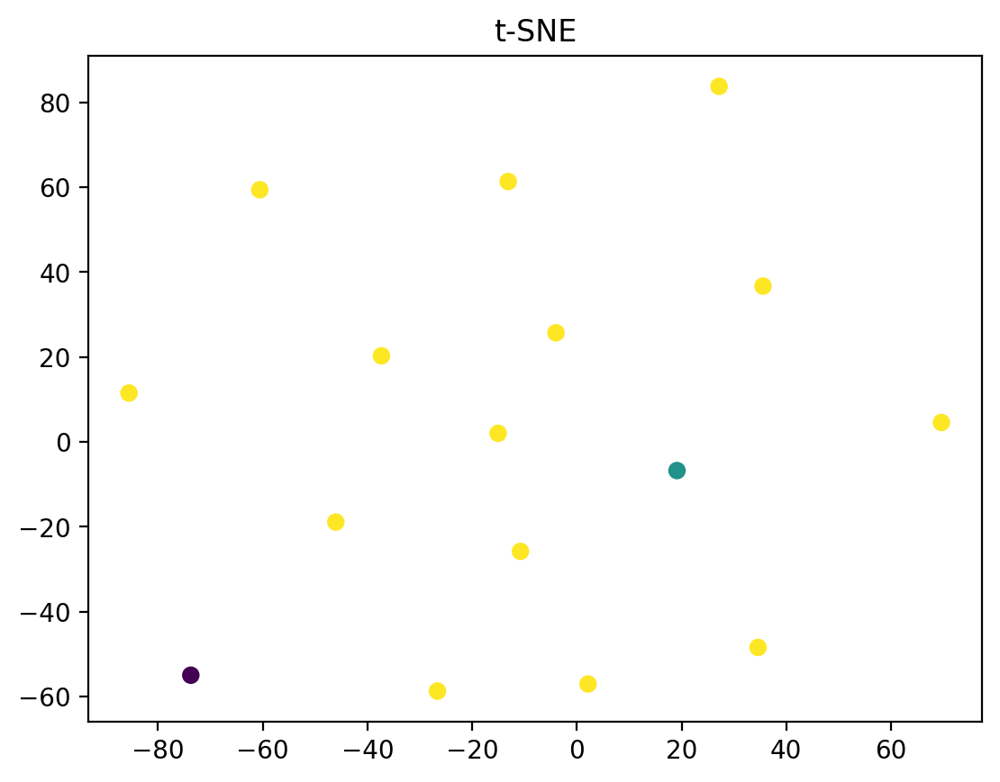

feature_maps torch.Size([1, 2048, 16, 8, 8])
activation set (16, 131072)
activations_sign_set (16, 131072)
[256.71466064453125, 256.71466064453125, 534.2265319824219, 810.336181640625, 1059.0963897705078, 1282.3189697265625, 1522.572525024414, 1754.9898681640625, 1965.8191223144531, 2188.8287048339844, 2426.4630432128906, 2672.805694580078, 2914.729721069336, 3177.7947540283203, 3444.747604370117, 3751.002182006836]
final selection: [2, 10]
cluster: [8, 8]
selection_dict:  {np.int32(1): [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14], np.int32(0): [12], np.int32(2): [15]}


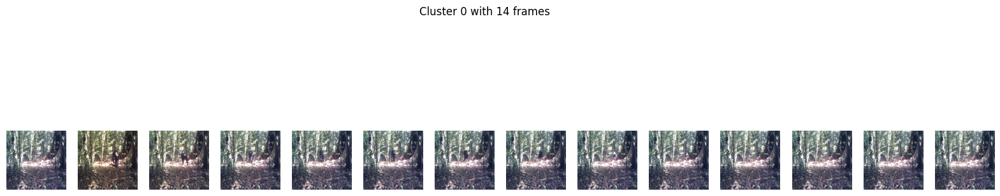

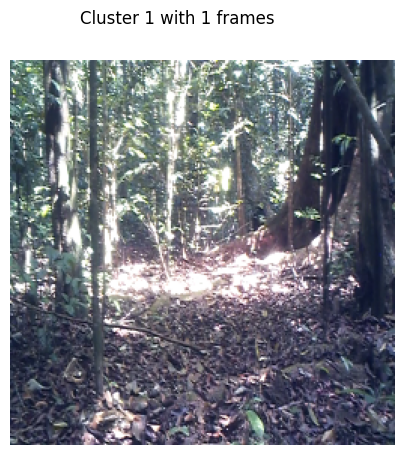

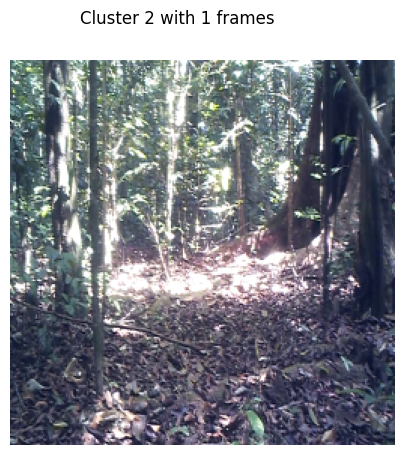

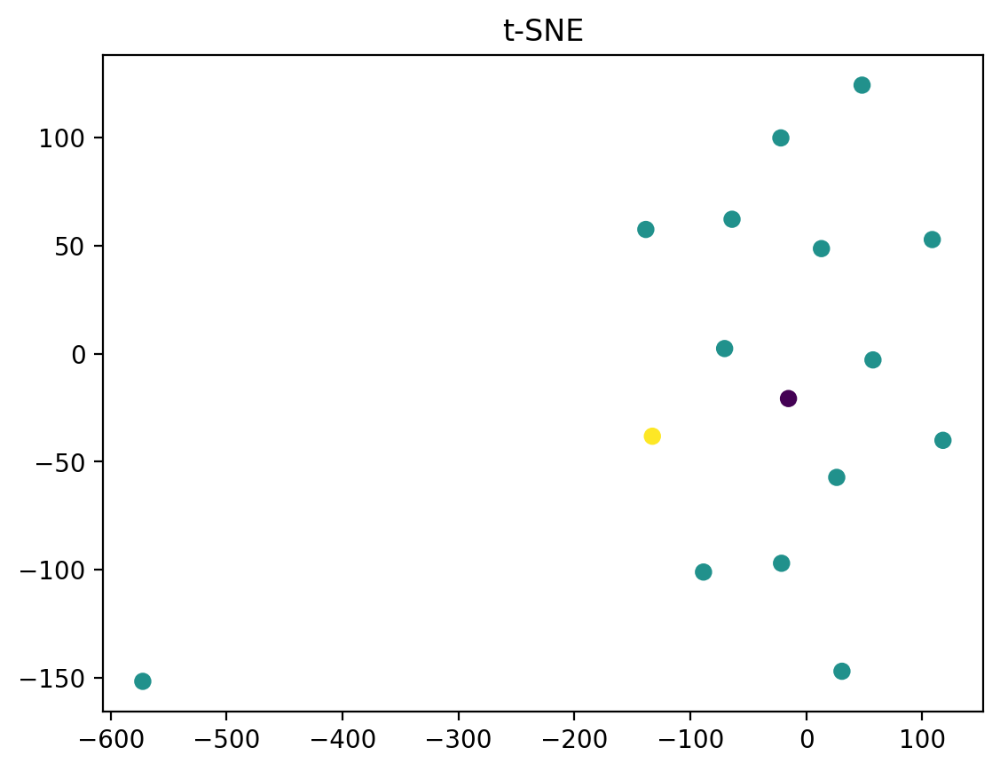

In [16]:
fps = 24
num_clusters = 3
selection_set = {}
cluster_set = []

model.eval()
for i, (inputs, labels, index, time, meta) in enumerate(loader):
    fg_batch_frames = get_video_frames(meta["fg_video_name"])
    # bg_batch_frames = get_video_frames(meta["bg_video_name"])

    with torch.no_grad():
        if torch.cuda.is_available():
            model = model.cuda()
            inputs["fg_frames"][0] = inputs["fg_frames"][0].cuda()

        feature_maps = model.s5(
            model.s4(model.s3(model.s2(model.s1([inputs["fg_frames"][0]]))))
        )[0]
        # feature_maps = get_feature_maps(model, inputs["fg_frames"])

        # batch_size = activations["s4.pathway0_res0.relu"][0].size(0)
        frame_size = feature_maps.size(2)
        print("feature_maps", feature_maps.shape)
        activations_set = (
            activations["s5.pathway0_res0.relu"][0].view(frame_size, -1).numpy()
        )

        print("activation set", activations_set.shape)

        # gather data from another device
        # activ = activations["s4.pathway0_res0.relu"][0].view(batch_size, -1).numpy()
        # activations_set = np.concatenate((activations_set, activ), axis=0)
        # print(activations_set.shape)
        activations_sign_set = activations_set
        #activations_sign_set[activations_sign_set == float(0)] = float(-1)
        #kmeans = KModes(
        #    n_clusters=num_clusters, init="Huang", n_init=5, max_iter=5, n_jobs=-2
        #)
        kmeans = KMeans(n_clusters=num_clusters)
        kmeans.fit(activations_sign_set)
        # kmeans.fit(np.sign(activations_sign_set))
        # kmeans = KMeans(n_clusters=2, n_init=5, max_iter=5)
        # kmeans.fit(np.sign(activations_sign_set))
        kmeans_labels = kmeans.labels_
        # print("K means labels: ", kmeans_labels)

        print("activations_sign_set", activations_sign_set.shape)

        selection_dict = {}
        for j in range(len(kmeans_labels)):
            if kmeans_labels[j] not in selection_dict:
                selection_dict[kmeans_labels[j]] = [j]
            else:
                selection_dict[kmeans_labels[j]] += [j]

        final_selection = []
        #cluster = []
        #for k, v in selection_dict.items():
        #    numbers = len(v)
        #    final_selection.append(v[np.random.randint(numbers)])
        #    cluster.append(numbers)
        #final_selection.sort()

        # accumulated distance selection
        euclidean = distance.euclidean(activations_set[0], activations_set[1])
        accum_dis = [euclidean] * 2
        for j in range(1, activations_set.shape[0] - 1):
            euclidean = distance.euclidean(activations_set[j], activations_set[j + 1])
            accum_dis.append(euclidean + accum_dis[-1])

        #hamming = distance.hamming(
        #    np.sign(activations_sign_set[0]), np.sign(activations_sign_set[1])
        #)
        #accum_dis = [hamming] * 2
        #for j in range(1, activations_sign_set.shape[0] - 1):
        #    hamming = distance.hamming(
        #        np.sign(activations_sign_set[j]), np.sign(activations_sign_set[j + 1])
        #    )
        #    accum_dis.append(hamming + accum_dis[-1])

        dis_index = accum_dis[-1] / 2

        print(accum_dis)

        cnt = 1
        clusters = []
        clus = []
        for k in range(activations_set.shape[0]):
            if accum_dis[k] <= dis_index * cnt:
                clus.append(k)
            else:
                clusters.append(clus)
                clus = []
                cnt += 1
                clus.append(k)
        clusters.append(clus)

        final_selection = []
        cluster = []
        for c in clusters:
            cluster.append(len(c))
            final_selection.append(random.choice(c))

        print("final selection:", final_selection)
        print("cluster:", cluster)

        selection_set[i] = final_selection
        print("selection_dict: ", selection_dict)
        cluster_set.append(cluster)

        # visualise frames with selected ids

        for k, v in enumerate(selection_dict):
            # check if list
            if isinstance(selection_dict[v], list):
                numbers = len(selection_dict[v])
            else:
                numbers = 1

            fig, ax = plt.subplots(1, numbers, figsize=(20, 5))
            fig.suptitle(f"Cluster {k} with {numbers} frames")

            # add title
            if numbers == 1:
                ax.axis("off")
                ax.imshow(fg_batch_frames[0][(selection_dict[v][0] * fps) - 1])
            else:
                for l, w in enumerate(selection_dict[v]):
                    ax[l].axis("off")
                    ax[l].imshow(fg_batch_frames[0][(w * fps) - 1])
            plt.show()

        # for k, v in enumerate(final_selection):
        #    ax[k].set_title(v)
        #    ax[k].axis("off")
        #    ax[k].imshow(fg_batch_frames[0][(v * fps) - 1])
        # plt.show()

        # plot t-SNE
        tsne = TSNE(n_components=2, perplexity=5, max_iter=300)
        tsne_results = tsne.fit_transform(activations_set)
        plt.figure(dpi=200)
        plt.title("t-SNE")
        plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=kmeans_labels)
        plt.show()

In [12]:
selection_set

{0: [2, 12],
 1: [3, 11],
 2: [7, 10],
 3: [2, 13],
 4: [2, 10],
 5: [5, 9],
 6: [0, 12],
 7: [1, 8]}

In [13]:
# get activations for s4 layer
s4_activations = activations["s4.pathway0_res0.relu"]

In [14]:
activations_sign_set
s4_activations[0].shape

torch.Size([1, 1024, 16, 16, 16])

In [15]:
kmeans = KMeans(n_clusters=2, init="Huang", n_init=5, max_iter=5).fit(
    np.sign(activations_sign_set)
)
# kmeans = KMeans(n_clusters=2, n_init=5, max_iter=5)
kmeans.fit(np.sign(activations_sign_set))
kmeans_labels = kmeans.labels_

InvalidParameterError: The 'init' parameter of KMeans must be a str among {'k-means++', 'random'}, a callable or an array-like. Got 'Huang' instead.

In [ ]:
final_selection